In [1]:
import os
import sys
import math
import argparse
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from sklearn.decomposition import PCA
from typing import Dict, List, Tuple, Iterable, Union, Optional, Set, Sequence, Callable, DefaultDict, Any

# Keras imports
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU, Lambda, Reshape, LayerNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.layers import SpatialDropout1D, SpatialDropout2D, SpatialDropout3D, add, concatenate
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Flatten, LSTM, RepeatVector
from tensorflow.keras.layers import Conv1D, Conv2D, Conv3D, UpSampling1D, UpSampling2D, UpSampling3D, MaxPooling1D
from tensorflow.keras.layers import MaxPooling2D, MaxPooling3D, AveragePooling1D, AveragePooling2D, AveragePooling3D, Layer
from tensorflow.keras.layers import SeparableConv1D, SeparableConv2D, DepthwiseConv2D, Concatenate, Add
from tensorflow.keras.layers import GlobalAveragePooling1D, GlobalAveragePooling2D, GlobalAveragePooling3D


# ML4CVD Imports
from ml4h.TensorMap import TensorMap
from ml4h.arguments import parse_args
from ml4h.models import make_multimodal_multitask_model, train_model_from_generators, make_hidden_layer_model, _conv_layer_from_kind_and_dimension
from ml4h.tensor_generators import TensorGenerator, big_batch_from_minibatch_generator, test_train_valid_tensor_generators
from ml4h.recipes import plot_predictions, infer_hidden_layer_multimodal_multitask

# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


Tensor = tf.Tensor

ACTIVATION_CLASSES = {
    'leaky': LeakyReLU(),
    'prelu': PReLU(),
    'elu': ELU(),
    'thresh_relu': ThresholdedReLU,
}
ACTIVATION_FUNCTIONS = {
    'swish': tf.nn.swish,
    'gelu': tfa.activations.gelu,
    'lisht': tfa.activations.lisht,
    'mish': tfa.activations.mish,
}
NORMALIZATION_CLASSES = {
    'batch_norm': BatchNormalization,
    'layer_norm': LayerNormalization,
    'instance_norm': tfa.layers.InstanceNormalization,
    'poincare_norm': tfa.layers.PoincareNormalize,
}
CONV_REGULARIZATION_CLASSES = {
    # class name -> (dimension -> class)
    'spatial_dropout': {2: SpatialDropout1D, 3: SpatialDropout2D, 4: SpatialDropout3D},
    'dropout': defaultdict(lambda _: Dropout),
}
DENSE_REGULARIZATION_CLASSES = {
    'dropout': Dropout,  # TODO: add l1, l2
}

In [ ]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/segmented-sax-lax/2020-07-07/', 
            '--input_tensors', 'lax_4ch_diastole_slice0_256_3d', 
            '--output_tensors', 'lax_4ch_diastole_slice0_256_3d',
            '--activation', 'leaky',
            '--conv_layers', '32',
            '--dense_blocks', '32',  '64',  '84', '92',
            '--conv_x', '3', 
            '--conv_y', '3',
            '--pool_x', '2',
            '--pool_y', '2',
            '--dense_layers', '1024',
            '--batch_size', '1',
            '--epochs', '598',
            '--patience', '148',
            '--learning_rate', '0.0001',
            '--training_steps', '256',
            '--validation_steps', '4',
            '--valid_ratio', '0.2',
            '--test_steps', '2',
            '--num_workers', '0',
            '--inspect_model',
            '--save_last_model',
            '--sample_csv', '/home/sam/lvh/small_set_500.csv',
            '--tensormap_prefix', 'ml4h.tensormap.ukb.mri',
            '--id', 'lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example']
args = parse_args()
model = make_multimodal_multitask_model(**args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
model = train_model_from_generators(
        model, generate_train, generate_valid, args.training_steps, args.validation_steps, args.batch_size,
        args.epochs, args.patience, args.output_folder, args.id, args.inspect_model, args.inspect_show_labels,
        save_last_model=args.save_last_model
)

2020-09-15 16:56:00,454 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/log_2020-09-15_16-56_0.log.
2020-09-15 16:56:00,573 - arguments:444 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/segmented-sax-lax/2020-07-07/ --input_tensors lax_4ch_diastole_slice0_256_3d --output_tensors lax_4ch_diastole_slice0_256_3d --activation leaky --conv_layers 32 --dense_blocks 32 64 84 92 --conv_x 3 --conv_y 3 --pool_x 2 --pool_y 2 --dense_layers 1024 --batch_size 1 --epochs 598 --patience 148 --learning_rate 0.0001 --training_steps 256 --validation_steps 4 --valid_ratio 0.2 --test_steps 2 --num_workers 0 --inspect_model --save_last_model --sample_csv /home/sam/lvh/small_set_500.csv --tensormap_prefix ml4h.tensormap.ukb.mri --id lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example

2020-09-15 16:56:00,575 - arguments:445 - INFO - Arguments are Namespa

2020-09-15 16:56:01,544 - tensor_generators:661 - INFO - Found 697 train, 199 validation, and 102 testing tensors at: /mnt/disks/segmented-sax-lax/2020-07-07/
2020-09-15 16:56:01,659 - models:1422 - INFO - Saving architecture diagram to:./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/architecture_graph_lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.png
2020-09-15 16:56:02,485 - tensor_generators:151 - INFO - Started 1 train workers with cache size 0.4375GB.
2020-09-15 16:56:02,550 - tensor_generators:151 - INFO - Started 1 validation workers with cache size 0.4375GB.
Train for 256 steps, validate for 1 steps
256/256 [==============================] - 31s 121ms/step - loss: 0.6394 - val_loss: 0.5248
2020-09-15 16:56:33,578 - models:1358 - INFO - Spent:31.10 seconds training, Samples trained on:256 Per sample training speed:0.121 seconds.
32/32 [==============================] - 1s 31ms/step
2020-09-15 16:56:34,659 - models:1366 - INFO 

256/256 [==============================] - 21s 82ms/step - loss: 0.2196 - val_loss: 0.2712
Epoch 15/598
205/256 [=======================>......] - ETA: 3s - loss: 0.22222020-09-15 17:01:47,888 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 6 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 6
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.2207
Epoch 00015: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.2204 - val_loss: 0.2623
Epoch 16/598
255/256 [============================>.] - ETA: 0s - loss: 0.2078
Epoch 00016: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_10

256/256 [==============================] - 21s 83ms/step - loss: 0.1492 - val_loss: 0.2299
Epoch 31/598
171/256 [===================>..........] - ETA: 6s - loss: 0.15102020-09-15 17:07:24,180 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 12 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 12
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.1498
Epoch 00031: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.1498 - val_loss: 0.2622
Epoch 32/598
255/256 [============================>.] - ETA: 0s - loss: 0.1414
Epoch 00032: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_

256/256 [==============================] - 21s 83ms/step - loss: 0.1159 - val_loss: 0.2694
Epoch 47/598
137/256 [===============>..............] - ETA: 8s - loss: 0.11592020-09-15 17:13:00,182 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 18 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 18
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.1139
Epoch 00047: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.1138 - val_loss: 0.2402
Epoch 48/598
255/256 [============================>.] - ETA: 0s - loss: 0.1117
Epoch 00048: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_

256/256 [==============================] - 21s 83ms/step - loss: 0.0960 - val_loss: 0.2488
Epoch 63/598
103/256 [===========>..................] - ETA: 10s - loss: 0.09912020-09-15 17:18:35,171 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 24 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 24
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0989
Epoch 00063: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0990 - val_loss: 0.2188
Epoch 64/598
255/256 [============================>.] - ETA: 0s - loss: 0.0947
Epoch 00064: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky

256/256 [==============================] - 21s 82ms/step - loss: 0.0838 - val_loss: 0.2343
Epoch 79/598
 69/256 [=======>......................] - ETA: 13s - loss: 0.08692020-09-15 17:24:10,119 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 30 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 30
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0857
Epoch 00079: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0856 - val_loss: 0.2268
Epoch 80/598
255/256 [============================>.] - ETA: 0s - loss: 0.0847
Epoch 00080: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky

256/256 [==============================] - 21s 82ms/step - loss: 0.0773 - val_loss: 0.2079
Epoch 95/598
 35/256 [===>..........................] - ETA: 15s - loss: 0.07782020-09-15 17:29:45,000 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 36 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 36
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0774
Epoch 00095: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0773 - val_loss: 0.2623
Epoch 96/598
255/256 [============================>.] - ETA: 0s - loss: 0.0758
Epoch 00096: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky

256/256 [==============================] - 21s 82ms/step - loss: 0.0719 - val_loss: 0.2530
Epoch 111/598
  1/256 [..............................] - ETA: 18s - loss: 0.06652020-09-15 17:35:19,804 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 42 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 42
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0712
Epoch 00111: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0712 - val_loss: 0.2311
Epoch 112/598
255/256 [============================>.] - ETA: 0s - loss: 0.0709
Epoch 00112: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_lea

255/256 [============================>.] - ETA: 0s - loss: 0.0663
Epoch 00126: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 81ms/step - loss: 0.0663 - val_loss: 0.2286
Epoch 127/598
255/256 [============================>.] - ETA: 0s - loss: 0.0665
Epoch 00127: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0664 - val_loss: 0.2158
Epoch 128/598
255/256 [============================>.] - ETA: 0s - loss: 0.0673
Epoch 00128: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0635
Epoch 00142: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0635 - val_loss: 0.2099
Epoch 143/598
255/256 [============================>.] - ETA: 0s - loss: 0.0644
Epoch 00143: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0643 - val_loss: 0.2056
Epoch 144/598
255/256 [============================>.] - ETA: 0s - loss: 0.06402020-09-15 17:47:12,876 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 10 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 199 paths. Epoch: 10
	190 tensors 

255/256 [============================>.] - ETA: 0s - loss: 0.06212020-09-15 17:52:06,816 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 11 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 199 paths. Epoch: 11
	190 tensors were presented.
	9 paths were skipped because they previously failed.
	No errors raised.
	

Epoch 00158: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0621 - val_loss: 0.2447
Epoch 159/598
255/256 [============================>.] - ETA: 0s - loss: 0.0618
Epoch 00159: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0618 - val_l

121/256 [=============>................] - ETA: 9s - loss: 0.05912020-09-15 17:57:32,745 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 66 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 66
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0589
Epoch 00174: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0589 - val_loss: 0.2418
Epoch 175/598
255/256 [============================>.] - ETA: 0s - loss: 0.0587
Epoch 00175: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [=========

Epoch 190/598
 87/256 [=========>....................] - ETA: 12s - loss: 0.05812020-09-15 18:03:08,054 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 72 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 72
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0576
Epoch 00190: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0575 - val_loss: 0.2617
Epoch 191/598
255/256 [============================>.] - ETA: 0s - loss: 0.0566
Epoch 00191: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256

Epoch 206/598
 53/256 [=====>........................] - ETA: 14s - loss: 0.05612020-09-15 18:08:42,892 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 78 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 78
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0564
Epoch 00206: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0564 - val_loss: 0.2407
Epoch 207/598
255/256 [============================>.] - ETA: 0s - loss: 0.0556
Epoch 00207: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256

Epoch 222/598
 19/256 [=>............................] - ETA: 16s - loss: 0.05502020-09-15 18:14:17,598 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 84 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 84
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0552
Epoch 00222: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0552 - val_loss: 0.2558
Epoch 223/598
255/256 [============================>.] - ETA: 0s - loss: 0.0547
Epoch 00223: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256

255/256 [============================>.] - ETA: 0s - loss: 0.0529
Epoch 00237: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0529 - val_loss: 0.2568
Epoch 238/598
255/256 [============================>.] - ETA: 0s - loss: 0.0543
Epoch 00238: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0543 - val_loss: 0.2409
Epoch 239/598
255/256 [============================>.] - ETA: 0s - loss: 0.0525
Epoch 00239: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0524
Epoch 00253: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0524 - val_loss: 0.2456
Epoch 254/598
255/256 [============================>.] - ETA: 0s - loss: 0.0529
Epoch 00254: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0528 - val_loss: 0.2591
Epoch 255/598
255/256 [============================>.] - ETA: 0s - loss: 0.0519
Epoch 00255: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0516
Epoch 00269: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0516 - val_loss: 0.2367
Epoch 270/598
255/256 [============================>.] - ETA: 0s - loss: 0.0518
Epoch 00270: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0518 - val_loss: 0.2525
Epoch 271/598
255/256 [============================>.] - ETA: 0s - loss: 0.0512
Epoch 00271: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0508
Epoch 00285: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0508 - val_loss: 0.2291
Epoch 286/598
255/256 [============================>.] - ETA: 0s - loss: 0.0494
Epoch 00286: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0494 - val_loss: 0.2336
Epoch 287/598
255/256 [============================>.] - ETA: 0s - loss: 0.0512
Epoch 00287: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0495
Epoch 00301: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0495 - val_loss: 0.2633
Epoch 302/598
255/256 [============================>.] - ETA: 0s - loss: 0.0497
Epoch 00302: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0498 - val_loss: 0.2174
Epoch 303/598
255/256 [============================>.] - ETA: 0s - loss: 0.0494
Epoch 00303: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0494
Epoch 00317: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 80ms/step - loss: 0.0495 - val_loss: 0.2343
Epoch 318/598
255/256 [============================>.] - ETA: 0s - loss: 0.0496
Epoch 00318: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 81ms/step - loss: 0.0496 - val_loss: 0.2438
Epoch 319/598
236/256 [==========================>...] - ETA: 1s - loss: 0.04802020-09-15 18:48:34,397 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 121 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 121
	677 tensors wer

255/256 [============================>.] - ETA: 0s - loss: 0.0484
Epoch 00333: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 20s 80ms/step - loss: 0.0484 - val_loss: 0.2782
Epoch 334/598
255/256 [============================>.] - ETA: 0s - loss: 0.04822020-09-15 18:53:44,714 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 23 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 199 paths. Epoch: 23
	190 tensors were presented.
	9 paths were skipped because they previously failed.
	No errors raised.
	

Epoch 00334: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 20s 80ms/step - loss: 0.0482 - val_l

  3/256 [..............................] - ETA: 17s - loss: 0.05012020-09-15 18:58:42,693 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 132 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 132
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0477
Epoch 00349: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0477 - val_loss: 0.2193
Epoch 350/598
255/256 [============================>.] - ETA: 0s - loss: 0.0488
Epoch 00350: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [======

255/256 [============================>.] - ETA: 0s - loss: 0.0478
Epoch 00364: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0478 - val_loss: 0.2194
Epoch 365/598
255/256 [============================>.] - ETA: 0s - loss: 0.0474
Epoch 00365: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0474 - val_loss: 0.2340
Epoch 366/598
255/256 [============================>.] - ETA: 0s - loss: 0.0479
Epoch 00366: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0426
Epoch 00380: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0425 - val_loss: 0.2599
Epoch 381/598
255/256 [============================>.] - ETA: 0s - loss: 0.0424
Epoch 00381: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0424 - val_loss: 0.2290
Epoch 382/598
255/256 [============================>.] - ETA: 0s - loss: 0.0420
Epoch 00382: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0423
Epoch 00396: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0423 - val_loss: 0.2601
Epoch 397/598
255/256 [============================>.] - ETA: 0s - loss: 0.0426
Epoch 00397: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0426 - val_loss: 0.2593
Epoch 398/598
255/256 [============================>.] - ETA: 0s - loss: 0.0424
Epoch 00398: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0417
Epoch 00412: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0417 - val_loss: 0.2433
Epoch 413/598
255/256 [============================>.] - ETA: 0s - loss: 0.0426
Epoch 00413: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0426 - val_loss: 0.2860
Epoch 414/598
255/256 [============================>.] - ETA: 0s - loss: 0.0421
Epoch 00414: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0423
Epoch 00428: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 83ms/step - loss: 0.0423 - val_loss: 0.2626
Epoch 429/598
255/256 [============================>.] - ETA: 0s - loss: 0.0420
Epoch 00429: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0419 - val_loss: 0.2435
Epoch 430/598
254/256 [============================>.] - ETA: 0s - loss: 0.04202020-09-15 19:27:28,816 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 163 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 163
	677 tensors wer

255/256 [============================>.] - ETA: 0s - loss: 0.0420
Epoch 00444: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0420 - val_loss: 0.2121
Epoch 445/598
255/256 [============================>.] - ETA: 0s - loss: 0.0417
Epoch 00445: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0418 - val_loss: 0.2417
Epoch 446/598
220/256 [========================>.....] - ETA: 2s - loss: 0.04212020-09-15 19:33:03,607 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 169 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 169
	677 tensors wer

255/256 [============================>.] - ETA: 0s - loss: 0.0414
Epoch 00460: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0414 - val_loss: 0.2331
Epoch 461/598
255/256 [============================>.] - ETA: 0s - loss: 0.0417
Epoch 00461: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 81ms/step - loss: 0.0416 - val_loss: 0.2242
Epoch 462/598
186/256 [====================>.........] - ETA: 4s - loss: 0.04192020-09-15 19:38:37,353 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 175 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 175
	677 tensors wer

Epoch 476/598
255/256 [============================>.] - ETA: 0s - loss: 0.0416
Epoch 00476: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 82ms/step - loss: 0.0416 - val_loss: 0.2436
Epoch 477/598
255/256 [============================>.] - ETA: 0s - loss: 0.0417
Epoch 00477: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_4layer_leaky_1024d_500example.h5
256/256 [==============================] - 21s 81ms/step - loss: 0.0417 - val_loss: 0.2825
Epoch 478/598
152/256 [================>.............] - ETA: 7s - loss: 0.04132020-09-15 19:44:10,835 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 181 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 181
	6

In [ ]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/segmented-sax-lax/2020-07-07/',
            '--tensormap_prefix', 'ml4h.tensormap.ukb.mri',
            '--input_tensors', 'lax_4ch_diastole_slice0_256_3d', 
            '--output_tensors', 'lax_4ch_diastole_slice0_256_3d',
            '--conv_layers', '192', '64', '12',
            '--dense_layers',
            '--batch_size', '2',
            '--epochs', '192',
            '--patience', '32',
            '--learning_rate', '0.001',
            '--training_steps', '256',
            '--validation_steps', '30',
            '--test_steps', '2',
            '--num_workers', '0',
            '--model_file', './recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5',
            '--id', 'lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example']
args = parse_args()
plot_predictions(args)
infer_hidden_layer_multimodal_multitask(args)

In [5]:
def plot_ae_towards_attractor(model, matrix, samples=6, steps = 30):
    sample_every = steps//samples
    fig, axes = plt.subplots(1, samples, figsize=(samples*16,16))
    col = 0
    for i in range(steps):
        if i % sample_every == 0 and col < samples:
            axes[col].imshow(matrix[0, :, :, 0], cmap = 'gray')
            axes[col].set_yticks(())
            col += 1
        matrix = model.predict(matrix)   
    return matrix

### Reconstructions from ConvNet are smooth, capture main cardiac chambers, but lose fine details

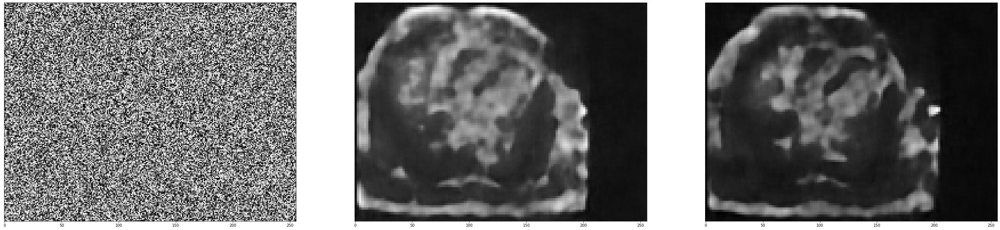

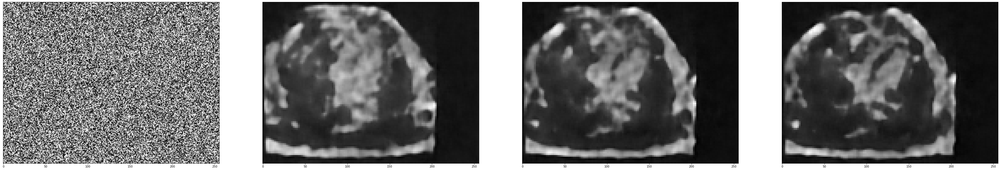

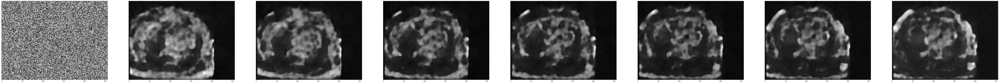

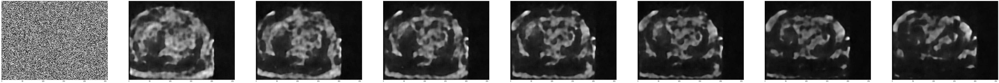

In [7]:
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 3, steps=18)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 4, steps=12)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 26)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 24)

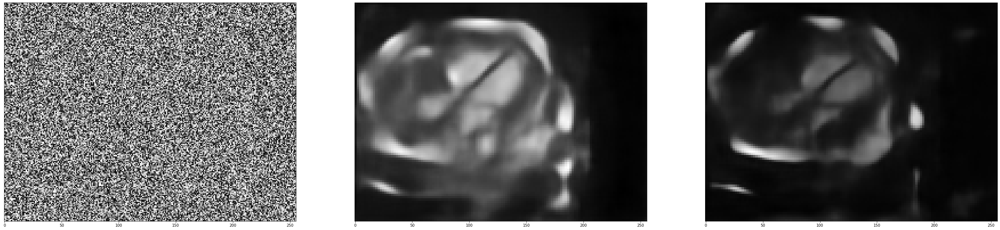

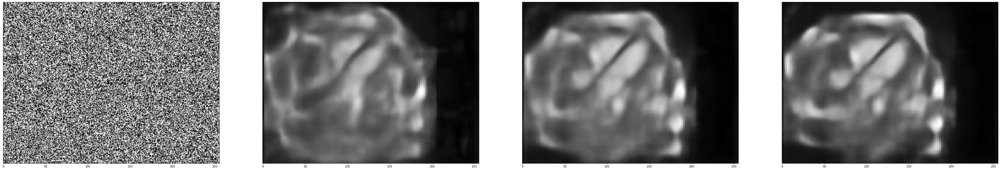

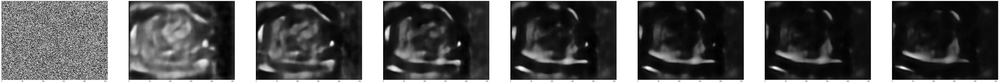

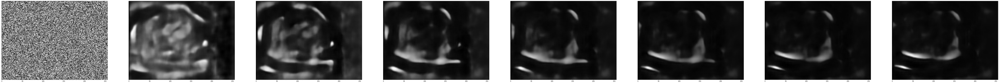

In [7]:
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 3, steps=12)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 4, steps=4)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 16)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 24)

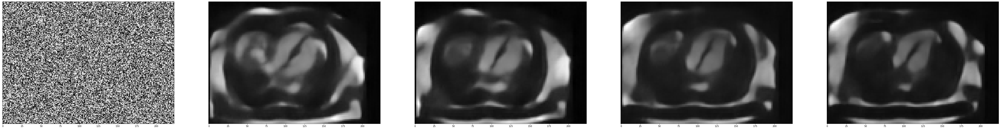

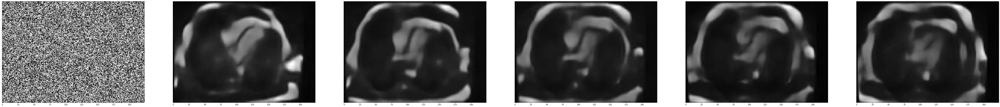

In [6]:
m = plot_ae_towards_attractor(model,  np.random.random((1,160,224,1)), samples=5, steps = 50)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,160,224,1)), steps=100)

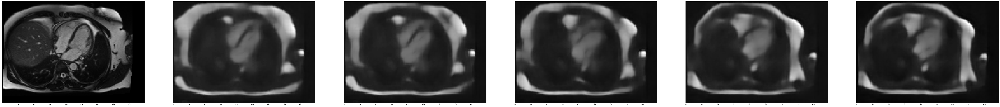

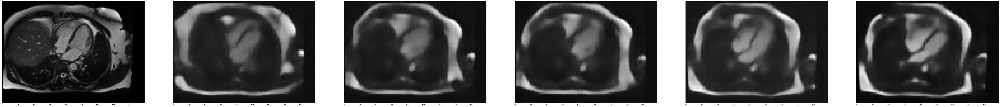

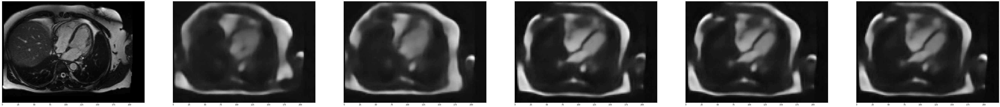

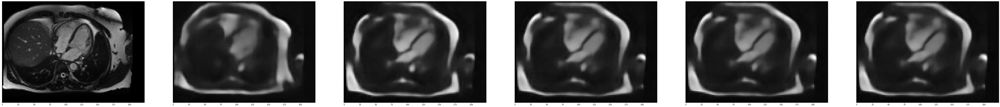

In [19]:
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=160)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=320)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=540)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=860)

In [2]:
def pca_on_matrix(matrix, pca_components):
    pca = PCA()
    pca.fit(matrix)
    print(f'PCA explains {100*np.sum(pca.explained_variance_ratio_[:pca_components]):0.1f}% of variance with {pca_components} top PCA components.')
    matrix_reduced = pca.transform(matrix)[:, :pca_components]
    print(f'PCA reduces matrix shape:{matrix_reduced.shape} from matrix shape: {matrix.shape}')
    plot_scree(pca_components, 100*pca.explained_variance_ratio_)
    return pca, matrix_reduced

def plot_scree(pca_components, percent_explained):
    _ = plt.figure(figsize=(6, 4))
    plt.plot(range(len(percent_explained)), percent_explained, 'g.-', linewidth=1)
    plt.axvline(x=pca_components, c='r', linewidth=3)
    label = f'{np.sum(percent_explained[:pca_components]):0.1f}% of variance explained by top {pca_components} of {len(percent_explained)} components'
    plt.text(pca_components+0.02*len(percent_explained), percent_explained[1], label)
    plt.title('Scree Plot')
    plt.xlabel('Principal Components')
    plt.ylabel('% of Variance Explained by Each Component')
    figure_path = f'./results/pca_{pca_components}_of_{len(percent_explained)}_testimonials.png'
    if not os.path.exists(os.path.dirname(figure_path)):
        os.makedirs(os.path.dirname(figure_path))
    plt.savefig(figure_path)
    
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) * 180 / 3.141592

def directions_in_latent_space(stratify_column, stratify_thresh, split_column, split_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    strat_vector = hit_mean_vector - miss_mean_vector
    
    hit1 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    miss1 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    hit2 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss2 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss_mean_vector1 = np.mean(miss1, axis=0)
    hit_mean_vector1 = np.mean(hit1, axis=0)
    angle1 = angle_between(miss_mean_vector1, hit_mean_vector1)
    miss_mean_vector2 = np.mean(miss2, axis=0)
    hit_mean_vector2 = np.mean(hit2, axis=0)
    angle2 = angle_between(miss_mean_vector2, hit_mean_vector2)
    h1_vector = hit_mean_vector1-miss_mean_vector1
    h2_vector = hit_mean_vector2-miss_mean_vector2
    angle3 = angle_between(h1_vector, h2_vector)
    angle4 = angle_between(strat_vector, h1_vector)
    angle5 = angle_between(strat_vector, h2_vector)
    print(f'\n Between {stratify_column}, and splits: {split_column}\n',
          f'Angles h1 and m1: {angle1:.2f}, h2 and m2 {angle2:.2f} h1-m1 and h2-m2 {angle3:.2f} degrees.\n'
          f'stratify threshold: {stratify_thresh}, split thresh: {split_thresh}, \n'
          f'hit_mean_vector2 shape {miss_mean_vector1.shape}, miss1:{hit_mean_vector2.shape} \n'
          f'{stratify_column} >= {stratify_thresh} && {split_column} >= {split_thresh} Hit1 shape: {hit1.shape}\n' 
          f'{stratify_column} < {stratify_thresh} && {split_column} >= {split_thresh} Miss1 shape: {miss1.shape}\n'
          f'{stratify_column} >= {stratify_thresh} && {split_column} < {split_thresh}  Hit1 shape: {hit2.shape}\n'
          f'{stratify_column} < {stratify_thresh} && {split_column} < {split_thresh}  Miss2 shape: {miss2.shape}\n'
          )

def stratify_latent_space(stratify_column, stratify_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    angle = angle_between(miss_mean_vector, hit_mean_vector)
    print(f'Angle between {stratify_column} centroid and all others is: {angle:.1f} degrees.\n'
          f'Hit shape {hit.shape}, miss:{miss.shape} threshold:{stratify_thresh}\n'
          f'Distance: {np.linalg.norm(hit_mean_vector-miss_mean_vector):.3f}, Hit std {np.std(hit, axis=1).mean():.3f}, miss std:{np.std(miss, axis=1).mean():.3f}\n')
    
def plot_pcs(sides, color_key):
    f, axes = plt.subplots(sides, sides, figsize=(16, 16))
    for i, ax in enumerate(axes.ravel()):
        colors = latent_df[color_key].to_numpy()
        points = ax.scatter(matrix_reduce[:, i], matrix_reduce[:, i+1], c=colors)
        f.colorbar(points, ax=ax)
        



        


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9464 entries, 0 to 9463
Columns: 1073 entries, sample_id to latent_1023
dtypes: float64(1069), int64(2), object(2)
memory usage: 77.5+ MB
False    2257
True       10
Name: has_ttntv, dtype: int64


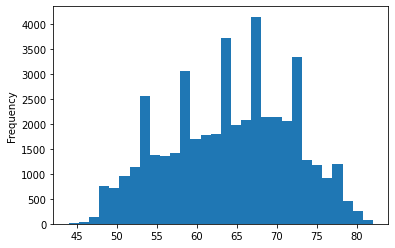

In [3]:
df = pd.read_csv('/home/sam/ml/trained_models/lax_4ch_diastole_autoencode_leaky_converge/tensors_all_union.csv')
df['21003_Age-when-attended-assessment-centre_2_0'].plot.hist(bins=30)
hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder/hidden_inference_lax_4ch_diastole_autoencoder.tsv'
#hidden_inference = '/home/sam/ml/trained_models/lax_4ch_diastole_leaky_wide_autoencode2/hidden_inference_lax_4ch_diastole_leaky_wide_autoencode2.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_converge/hidden_inference_lax_4ch_diastole_autoencoder_converge.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_no_flat2/hidden_inference_lax_4ch_diastole_autoencoder_no_flat2.tsv'
#hidden_inference = '/home/sam/hidden_inference_no_flat2_3000.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_16_12_pool2_392d/hidden_inference_lax_4ch_diastole_autoencoder_16_12_pool2_392d.tsv'
hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/hidden_inference_lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.tsv'
df2 = pd.read_csv(hidden_inference, sep='\t')
df['fpath'] = pd.to_numeric(df['fpath'], errors='coerce')
df2['sample_id'] = pd.to_numeric(df2['sample_id'], errors='coerce')
#df.info()
latent_df = pd.merge(df, df2, left_on='fpath', right_on='sample_id', how='inner')
#latent_df.info()
df3 = pd.read_csv('/home/sam/tsvs/ttn_disease.tsv', sep='\t')
df4 = pd.read_csv('/home/sam/csvs/has_exome.csv')
latent_df = pd.merge(df3, latent_df, left_on='sample_id', right_on='sample_id', how='right')
latent_df.info()
print(latent_df['has_ttntv'].value_counts())

In [4]:
latent_df.head()

,sample_id,has_ttntv,incident_composite_af_chf_dcm_death,composite_af_chf_dcm_death_free_survival,incident_af,af_free_survival,incident_dcm,dcm_free_survival,incident_chf,chf_free_survival,...,latent_1014,latent_1015,latent_1016,latent_1017,latent_1018,latent_1019,latent_1020,latent_1021,latent_1022,latent_1023
0,1000169,False,0.0,0.709056,0.0,0.709056,0.0,0.709056,0.0,0.709056,...,0.846805,-0.514058,1.142235,2.611794,0.777341,0.142172,3.235310,-1.164376,-1.024390,1.200420
1,1000571,False,0.0,0.678919,0.0,0.678919,0.0,0.678919,0.0,0.678919,...,-0.336524,-0.243518,-0.068181,0.493717,1.913895,-2.550770,1.420316,-1.233647,0.844632,-2.159872
2,1000795,False,0.0,0.523896,0.0,0.523896,0.0,0.523896,0.0,0.523896,...,1.180854,0.563495,1.247750,0.808089,3.063236,-1.308537,0.342876,0.057588,-0.064330,-2.660147
3,1000800,False,0.0,2.693303,0.0,2.693303,0.0,2.693303,0.0,2.693303,...,3.752954,1.597297,0.852667,2.652089,1.444650,-3.844065,-1.674709,-3.180631,3.770012,1.225157
4,1001047,False,0.0,1.562481,0.0,1.562481,0.0,1.562481,0.0,1.562481,...,4.182530,-2.083606,0.926726,1.110789,-0.318785,-0.416726,0.558199,0.505702,2.460867,1.948582


### Latent space of the Non-U-net CNN has clear alignments for basic phenotypes
- BMI, sex, left ventricle mass, afib and CAD diagnosis showed large differences in Radians.
- Sanity check: stratifying by sample ID does not show much alignment.

PCA explains 36.0% of variance with 10 top PCA components.
PCA reduces matrix shape:(9464, 10) from matrix shape: (9464, 1024)
Angle between Sex_Female_0_0 centroid and all others is: 45.9 degrees.
Hit shape (4955, 1024), miss:(4509, 1024) threshold:1.0
Distance: 23.508, Hit std 2.526, miss std:2.448

Angle between has_ttntv centroid and all others is: 42.5 degrees.
Hit shape (10, 1024), miss:(2257, 1024) threshold:1.0
Distance: 28.749, Hit std 2.538, miss std:2.492

Angle between atrial_fibrillation_or_flutter centroid and all others is: 25.3 degrees.
Hit shape (385, 1024), miss:(9079, 1024) threshold:1.0
Distance: 12.140, Hit std 2.446, miss std:2.491

Angle between coronary_artery_disease centroid and all others is: 24.1 degrees.
Hit shape (348, 1024), miss:(9116, 1024) threshold:1.0
Distance: 11.818, Hit std 2.464, miss std:2.490

Angle between hypertension centroid and all others is: 20.5 degrees.
Hit shape (2991, 1024), miss:(6473, 1024) threshold:1.0
Distance: 10.009, Hit std 2.

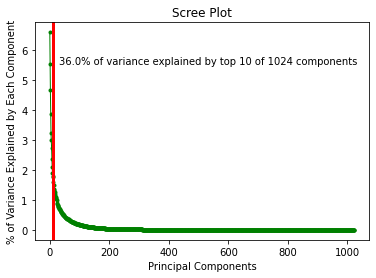

In [5]:
import matplotlib.pyplot as plt
latent_dimension = 1024
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 1250000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 36.0% of variance with 10 top PCA components.
PCA reduces matrix shape:(9464, 10) from matrix shape: (9464, 1024)

 Between Sex_Female_0_0, and splits: LVEF
 Angles h1 and m1: 47.51, h2 and m2 65.20 h1-m1 and h2-m2 36.98 degrees.
stratify threshold: 1.0, split thresh: 50, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
Sex_Female_0_0 >= 1.0 && LVEF >= 50 Hit1 shape: (434, 1024)
Sex_Female_0_0 < 1.0 && LVEF >= 50 Miss1 shape: (372, 1024)
Sex_Female_0_0 >= 1.0 && LVEF < 50  Hit1 shape: (10, 1024)
Sex_Female_0_0 < 1.0 && LVEF < 50  Miss2 shape: (37, 1024)


 Between Sex_Female_0_0, and splits: LVM
 Angles h1 and m1: 44.76, h2 and m2 46.21 h1-m1 and h2-m2 49.10 degrees.
stratify threshold: 1.0, split thresh: 100, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
Sex_Female_0_0 >= 1.0 && LVM >= 100 Hit1 shape: (22, 1024)
Sex_Female_0_0 < 1.0 && LVM >= 100 Miss1 shape: (226, 1024)
Sex_Female_0_0 >= 1.0 && LVM < 100  Hit1 shape: (425, 1024)
Sex_Female_0_0 < 1.0 && LVM < 100  Miss2 

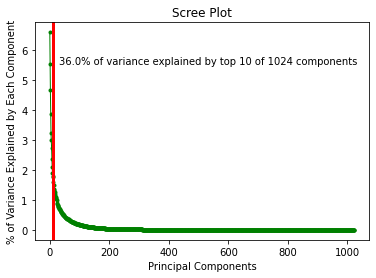

In [7]:
latent_dimension = 1024
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'Sex_Female_0_0']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 1750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 1.0, strat, thresh, latent_cols, latent_df)

In [1]:
import os
import sys
import math
import argparse
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from sklearn.decomposition import PCA
from typing import Dict, List, Tuple, Iterable, Union, Optional, Set, Sequence, Callable, DefaultDict, Any

# Keras imports
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU, Lambda, Reshape, LayerNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.layers import SpatialDropout1D, SpatialDropout2D, SpatialDropout3D, add, concatenate
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Flatten, LSTM, RepeatVector
from tensorflow.keras.layers import Conv1D, Conv2D, Conv3D, UpSampling1D, UpSampling2D, UpSampling3D, MaxPooling1D
from tensorflow.keras.layers import MaxPooling2D, MaxPooling3D, AveragePooling1D, AveragePooling2D, AveragePooling3D, Layer
from tensorflow.keras.layers import SeparableConv1D, SeparableConv2D, DepthwiseConv2D, Concatenate, Add
from tensorflow.keras.layers import GlobalAveragePooling1D, GlobalAveragePooling2D, GlobalAveragePooling3D


# ML4CVD Imports
from ml4h.TensorMap import TensorMap
from ml4h.arguments import parse_args
from ml4h.models import make_multimodal_multitask_model, train_model_from_generators, make_hidden_layer_model, _conv_layer_from_kind_and_dimension
from ml4h.tensor_generators import TensorGenerator, big_batch_from_minibatch_generator, test_train_valid_tensor_generators
from ml4h.recipes import plot_predictions, infer_hidden_layer_multimodal_multitask

# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


Tensor = tf.Tensor

ACTIVATION_CLASSES = {
    'leaky': LeakyReLU(),
    'prelu': PReLU(),
    'elu': ELU(),
    'thresh_relu': ThresholdedReLU,
}
ACTIVATION_FUNCTIONS = {
    'swish': tf.nn.swish,
    'gelu': tfa.activations.gelu,
    'lisht': tfa.activations.lisht,
    'mish': tfa.activations.mish,
}
NORMALIZATION_CLASSES = {
    'batch_norm': BatchNormalization,
    'layer_norm': LayerNormalization,
    'instance_norm': tfa.layers.InstanceNormalization,
    'poincare_norm': tfa.layers.PoincareNormalize,
}
CONV_REGULARIZATION_CLASSES = {
    # class name -> (dimension -> class)
    'spatial_dropout': {2: SpatialDropout1D, 3: SpatialDropout2D, 4: SpatialDropout3D},
    'dropout': defaultdict(lambda _: Dropout),
}
DENSE_REGULARIZATION_CLASSES = {
    'dropout': Dropout,  # TODO: add l1, l2
}

PCA explains 36.0% of variance with 10 top PCA components.
PCA reduces matrix shape:(9464, 10) from matrix shape: (9464, 1024)

 Between sample_id, and splits: LVEF
 Angles h1 and m1: 7.95, h2 and m2 36.72 h1-m1 and h2-m2 87.11 degrees.
stratify threshold: 1550000, split thresh: 50, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
sample_id >= 1550000 && LVEF >= 50 Hit1 shape: (452, 1024)
sample_id < 1550000 && LVEF >= 50 Miss1 shape: (354, 1024)
sample_id >= 1550000 && LVEF < 50  Hit1 shape: (30, 1024)
sample_id < 1550000 && LVEF < 50  Miss2 shape: (17, 1024)


 Between sample_id, and splits: LVM
 Angles h1 and m1: 15.04, h2 and m2 11.36 h1-m1 and h2-m2 112.02 degrees.
stratify threshold: 1550000, split thresh: 100, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
sample_id >= 1550000 && LVM >= 100 Hit1 shape: (149, 1024)
sample_id < 1550000 && LVM >= 100 Miss1 shape: (99, 1024)
sample_id >= 1550000 && LVM < 100  Hit1 shape: (336, 1024)
sample_id < 1550000 && LVM < 100  Miss2 shape: (27

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)



 Between sample_id, and splits: sample_id
 Angles h1 and m1: nan, h2 and m2 nan h1-m1 and h2-m2 nan degrees.
stratify threshold: 1550000, split thresh: 1550000, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
sample_id >= 1550000 && sample_id >= 1550000 Hit1 shape: (4467, 1024)
sample_id < 1550000 && sample_id >= 1550000 Miss1 shape: (0, 1024)
sample_id >= 1550000 && sample_id < 1550000  Hit1 shape: (0, 1024)
sample_id < 1550000 && sample_id < 1550000  Miss2 shape: (4997, 1024)


 Between sample_id, and splits: 21001_Body-mass-index-BMI_0_0
 Angles h1 and m1: 5.78, h2 and m2 4.04 h1-m1 and h2-m2 80.50 degrees.
stratify threshold: 1550000, split thresh: 27.5, 
hit_mean_vector2 shape (1024,), miss1:(1024,) 
sample_id >= 1550000 && 21001_Body-mass-index-BMI_0_0 >= 27.5 Hit1 shape: (1623, 1024)
sample_id < 1550000 && 21001_Body-mass-index-BMI_0_0 >= 27.5 Miss1 shape: (1774, 1024)
sample_id >= 1550000 && 21001_Body-mass-index-BMI_0_0 < 27.5  Hit1 shape: (2840, 1024)
sample_id < 1550000 && 

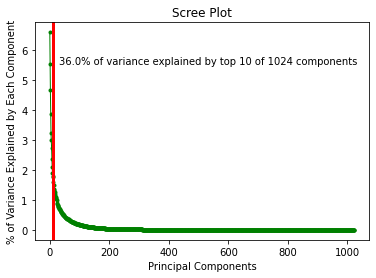

In [8]:
latent_dimension = 1024
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'sample_id']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 1750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 1750000, strat, thresh, latent_cols, latent_df)

2020-09-15 14:51:52,537 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/log_2020-09-15_14-51_0.log.
2020-09-15 14:51:52,540 - arguments:444 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/segmented-sax-lax/2020-07-07/ --input_tensors lax_4ch_diastole_slice0_256_3d --output_tensors lax_4ch_diastole_slice0_256_3d --activation leaky --conv_layers 32 --dense_blocks 32 32 32 --conv_x 3 --conv_y 3 --pool_x 2 --pool_y 2 --dense_layers 1024 --batch_size 1 --epochs 198 --patience 48 --learning_rate 0.00001 --training_steps 256 --validation_steps 4 --valid_ratio 0.2 --test_steps 2 --num_workers 0 --inspect_model --save_last_model --sample_csv /home/sam/lvh/small_set_500.csv --tensormap_prefix ml4h.tensormap.ukb.mri --id lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example

2020-09-15 14:51:52,541 - arguments:445 - INFO - Arguments are Namespace(

2020-09-15 14:51:53,275 - tensor_generators:661 - INFO - Found 697 train, 199 validation, and 102 testing tensors at: /mnt/disks/segmented-sax-lax/2020-07-07/
2020-09-15 14:51:53,421 - models:1422 - INFO - Saving architecture diagram to:./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/architecture_graph_lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.png
2020-09-15 14:51:54,161 - tensor_generators:151 - INFO - Started 1 train workers with cache size 0.4375GB.
2020-09-15 14:51:54,209 - tensor_generators:151 - INFO - Started 1 validation workers with cache size 0.4375GB.
Train for 256 steps, validate for 1 steps
256/256 [==============================] - 28s 109ms/step - loss: 0.8174 - val_loss: 0.5464
2020-09-15 14:52:22,188 - models:1358 - INFO - Spent:28.03 seconds training, Samples trained on:256 Per sample training speed:0.109 seconds.
32/32 [==============================] - 1s 27ms/step
2020-09-15 14:52:23,131 - models:1366 - INFO 

256/256 [==============================] - 24s 93ms/step - loss: 0.2088 - val_loss: 0.9176
Epoch 15/198
205/256 [=======================>......] - ETA: 3s - loss: 0.21452020-09-15 14:58:15,154 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 6 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 6
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.2117
Epoch 00015: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.2115 - val_loss: 1.0122
Epoch 16/198
255/256 [============================>.] - ETA: 0s - loss: 0.1950
Epoch 00016: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_10

256/256 [==============================] - 24s 93ms/step - loss: 0.1466 - val_loss: 0.9928
Epoch 31/198
171/256 [===================>..........] - ETA: 6s - loss: 0.14932020-09-15 15:04:32,984 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 12 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 12
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.1472
Epoch 00031: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.1471 - val_loss: 0.9560
Epoch 32/198
255/256 [============================>.] - ETA: 0s - loss: 0.1401
Epoch 00032: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_

256/256 [==============================] - 24s 93ms/step - loss: 0.1194 - val_loss: 0.8707
Epoch 47/198
137/256 [===============>..............] - ETA: 9s - loss: 0.11962020-09-15 15:10:50,562 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 18 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 18
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.1189
Epoch 00047: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.1189 - val_loss: 0.8126
Epoch 48/198
255/256 [============================>.] - ETA: 0s - loss: 0.1162
Epoch 00048: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_

256/256 [==============================] - 24s 93ms/step - loss: 0.0984 - val_loss: 0.9542
Epoch 63/198
103/256 [===========>..................] - ETA: 11s - loss: 0.09952020-09-15 15:17:07,310 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 24 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 24
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0968
Epoch 00063: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.0969 - val_loss: 0.9112
Epoch 64/198
255/256 [============================>.] - ETA: 0s - loss: 0.0930
Epoch 00064: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky

256/256 [==============================] - 24s 92ms/step - loss: 0.0874 - val_loss: 1.1359
Epoch 79/198
 69/256 [=======>......................] - ETA: 14s - loss: 0.08962020-09-15 15:23:24,445 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 30 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 30
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0884
Epoch 00079: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.0884 - val_loss: 0.9244
Epoch 80/198
255/256 [============================>.] - ETA: 0s - loss: 0.0868
Epoch 00080: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky

256/256 [==============================] - 24s 93ms/step - loss: 0.0820 - val_loss: 0.9288
Epoch 95/198
 35/256 [===>..........................] - ETA: 17s - loss: 0.08122020-09-15 15:29:40,599 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 36 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 36
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0815
Epoch 00095: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 92ms/step - loss: 0.0815 - val_loss: 1.0242
Epoch 96/198
255/256 [============================>.] - ETA: 0s - loss: 0.0803
Epoch 00096: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky

256/256 [==============================] - 24s 92ms/step - loss: 0.0765 - val_loss: 1.0087
Epoch 111/198
  1/256 [..............................] - ETA: 20s - loss: 0.07482020-09-15 15:35:55,863 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 42 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 697 paths. Epoch: 42
	677 tensors were presented.
	20 paths were skipped because they previously failed.
	No errors raised.
	
255/256 [============================>.] - ETA: 0s - loss: 0.0743
Epoch 00111: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 92ms/step - loss: 0.0743 - val_loss: 1.0673
Epoch 112/198
255/256 [============================>.] - ETA: 0s - loss: 0.0744
Epoch 00112: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_lea

255/256 [============================>.] - ETA: 0s - loss: 0.0710
Epoch 00126: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 92ms/step - loss: 0.0711 - val_loss: 1.0038
Epoch 127/198
255/256 [============================>.] - ETA: 0s - loss: 0.0707
Epoch 00127: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.0706 - val_loss: 0.9299
Epoch 128/198
255/256 [============================>.] - ETA: 0s - loss: 0.0725
Epoch 00128: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 92ms/ste

255/256 [============================>.] - ETA: 0s - loss: 0.0687
Epoch 00142: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.0687 - val_loss: 0.9611
Epoch 143/198
255/256 [============================>.] - ETA: 0s - loss: 0.0688
Epoch 00143: saving model to ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5
256/256 [==============================] - 24s 93ms/step - loss: 0.0688 - val_loss: 0.9472
Epoch 144/198
255/256 [============================>.] - ETA: 0s - loss: 0.06942020-09-15 15:49:15,593 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 10 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 199 paths. Epoch: 10
	190 tensors 

<Figure size 1152x1152 with 0 Axes>

2020-09-15 15:56:29,089 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/log_2020-09-15_15-56_0.log.
2020-09-15 15:56:29,090 - arguments:444 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/segmented-sax-lax/2020-07-07/ --tensormap_prefix ml4h.tensormap.ukb.mri --input_tensors lax_4ch_diastole_slice0_256_3d --output_tensors lax_4ch_diastole_slice0_256_3d --conv_layers 192 64 12 --dense_layers --batch_size 2 --epochs 192 --patience 32 --learning_rate 0.001 --training_steps 256 --validation_steps 30 --test_steps 2 --num_workers 0 --model_file ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example.h5 --id lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example

2020-09-15 15:56:29,092 - arguments:445 - INFO - Arguments are Namespace(activation='relu', a

2020-09-15 15:56:32,049 - tensor_generators:151 - INFO - Started 1 test workers with cache size 0.0GB.
2020-09-15 15:56:32,603 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_256_3d_continuous and shape:(4, 192, 256, 1).
2020-09-15 15:56:32,604 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_256_3d_continuous and shape:(4, 192, 256, 1).
2020-09-15 15:56:33,184 - explorations:57 - INFO - Write predictions as PNGs TensorMap:lax_4ch_diastole_slice0_256_3d, y shape:(4, 192, 256, 1) labels:(4, 192, 256, 1) folder:./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/prediction_pngs/
2020-09-15 15:56:33,593 - tensor_generators:151 - INFO - Started 1 workers with cache size 0.4375GB.
2020-09-15 15:56:33,595 - models:986 - INFO - Attempting to load model file from: ./recipes_output/lax_4ch_diastole_autoencoder_pool2_3layer_leaky_1024d_500example/lax_4ch_diastole_

2020-09-15 15:56:34,754 - recipes:310 - INFO - Dummy output shape is: (1, 1024) latent dimensions: 1024
2020-09-15 15:57:18,615 - recipes:334 - INFO - Wrote:500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1054769.hd5
2020-09-15 15:57:56,927 - recipes:334 - INFO - Wrote:1000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1112392.hd5
2020-09-15 15:58:34,486 - recipes:334 - INFO - Wrote:1500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1169485.hd5
2020-09-15 15:59:12,103 - recipes:334 - INFO - Wrote:2000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1225984.hd5
2020-09-15 15:59:54,575 - recipes:334 - INFO - Wrote:2500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1280344.hd5
2020-09-15 16:00:38,937 - recipes:334 - INFO - Wrote:3000 rows of latent space inference.  Last tensor:/mnt/disks/segmente

Exception ignored in: <bound method IteratorResourceDeleter.__del__ of <tensorflow.python.data.ops.iterator_ops.IteratorResourceDeleter object at 0x7f752c4531d0>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/data/ops/iterator_ops.py", line 537, in __del__
    handle=self._handle, deleter=self._deleter)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/ops/gen_dataset_ops.py", line 1139, in delete_iterator
    tld.op_callbacks, handle, deleter)
KeyboardInterrupt: 


2020-09-15 16:09:29,494 - recipes:334 - INFO - Wrote:8500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1939578.hd5
2020-09-15 16:10:19,565 - recipes:334 - INFO - Wrote:9000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1991958.hd5


KeyboardInterrupt: 